# **Importing libraries**

In [49]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [50]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mysql.connector
import numpy as np

# **Customer Table**

In [9]:
# load customer table
path="Customers.csv"
df_customers=pd.read_csv(path,encoding='latin-1')
df_customers

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,7/3/1939
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,9/27/1979
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,5/26/1947
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,9/17/1957
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,11/19/1965
...,...,...,...,...,...,...,...,...,...,...
15261,2099600,Female,Denisa Duková,Houston,TX,Texas,77017,United States,North America,3/25/1936
15262,2099618,Male,Justin Solórzano,Mclean,VA,Virginia,22101,United States,North America,2/16/1992
15263,2099758,Male,Svend Petrussen,Wilmington,NC,North Carolina,28405,United States,North America,11/9/1937
15264,2099862,Female,Lorenza Rush,Riverside,CA,California,92501,United States,North America,10/12/1937


In [10]:
df_customers['Birthday'] = pd.to_datetime(df_customers['Birthday'], format="%m/%d/%Y", errors='coerce').dt.date
df_customers

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,1939-07-03
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,1947-05-26
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,1957-09-17
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,1965-11-19
...,...,...,...,...,...,...,...,...,...,...
15261,2099600,Female,Denisa Duková,Houston,TX,Texas,77017,United States,North America,1936-03-25
15262,2099618,Male,Justin Solórzano,Mclean,VA,Virginia,22101,United States,North America,1992-02-16
15263,2099758,Male,Svend Petrussen,Wilmington,NC,North Carolina,28405,United States,North America,1937-11-09
15264,2099862,Female,Lorenza Rush,Riverside,CA,California,92501,United States,North America,1937-10-12


In [11]:
#check data types
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15266 entries, 0 to 15265
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   CustomerKey  15266 non-null  int64 
 1   Gender       15266 non-null  object
 2   Name         15266 non-null  object
 3   City         15266 non-null  object
 4   State Code   15256 non-null  object
 5   State        15266 non-null  object
 6   Zip Code     15266 non-null  object
 7   Country      15266 non-null  object
 8   Continent    15266 non-null  object
 9   Birthday     15266 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.2+ MB


In [12]:
# check missing values
df_customers.isnull().sum()

CustomerKey     0
Gender          0
Name            0
City            0
State Code     10
State           0
Zip Code        0
Country         0
Continent       0
Birthday        0
dtype: int64

In [13]:
# drop the missing values
df_customers.dropna(inplace=True)
df_customers.isnull().sum()

CustomerKey    0
Gender         0
Name           0
City           0
State Code     0
State          0
Zip Code       0
Country        0
Continent      0
Birthday       0
dtype: int64

In [14]:
# drop the columns
df_customers.drop(["State Code","Zip Code"],axis=1,inplace=True)

In [15]:
df_customers

,CustomerKey,Gender,Name,City,State,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,South Australia,Australia,Australia,1939-07-03
1,325,Female,Madison Hull,MOUNT BUDD,Western Australia,Australia,Australia,1979-09-27
2,554,Female,Claire Ferres,WINJALLOK,Victoria,Australia,Australia,1947-05-26
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,South Australia,Australia,Australia,1957-09-17
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,Victoria,Australia,Australia,1965-11-19
...,...,...,...,...,...,...,...,...
15261,2099600,Female,Denisa Duková,Houston,Texas,United States,North America,1936-03-25
15262,2099618,Male,Justin Solórzano,Mclean,Virginia,United States,North America,1992-02-16
15263,2099758,Male,Svend Petrussen,Wilmington,North Carolina,United States,North America,1937-11-09
15264,2099862,Female,Lorenza Rush,Riverside,California,United States,North America,1937-10-12


Text(0.5, 1.0, 'counts as per Country')

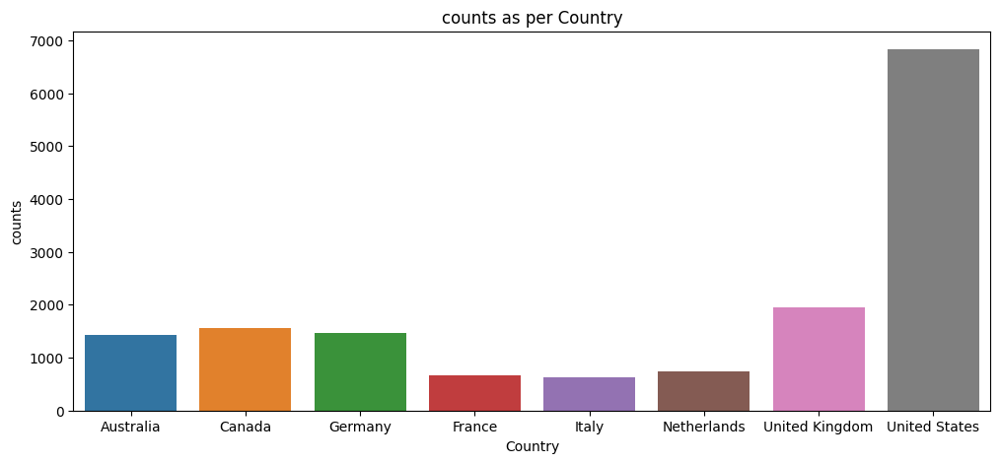

In [17]:
# visualize country counts
plt.figure(figsize=(12,5))
sns.countplot(x=df_customers["Country"],data=df_customers,hue="Country")
plt.xlabel("Country")
plt.ylabel("counts")
plt.title("counts as per Country")

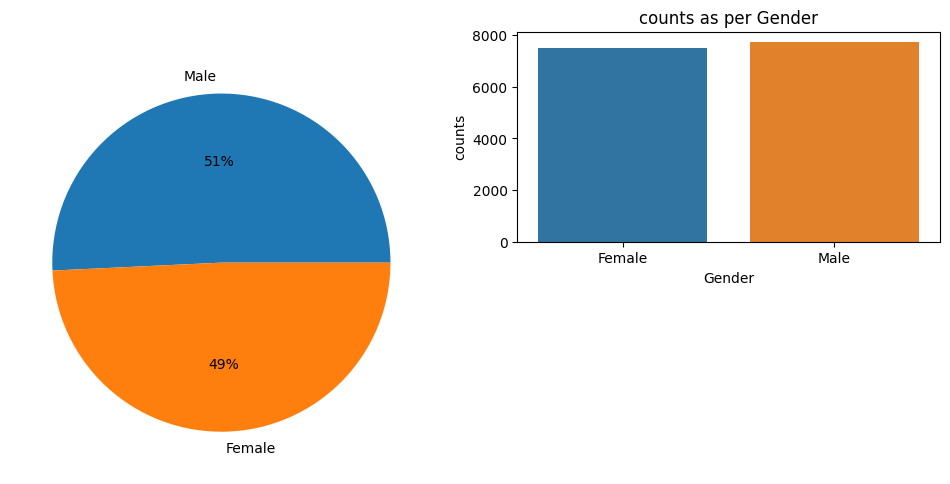

In [18]:
# visualize gender details
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.pie(df_customers["Gender"].value_counts(), 
        autopct='%1.0f%%', 
        labels=['Male', 'Female'])
plt.subplot(2,2,2)
sns.countplot(x=df_customers["Gender"],data=df_customers,hue="Gender")
plt.xlabel("Gender")
plt.ylabel("counts")
plt.title("counts as per Gender")
plt.show()

# **Exchange_rates**

In [19]:
# load exchange rates table
path="Exchange_Rates.csv"
df_exchange=pd.read_csv(path)
df_exchange

,Date,Currency,Exchange
0,1/1/2015,USD,1.0000
1,1/1/2015,CAD,1.1583
2,1/1/2015,AUD,1.2214
3,1/1/2015,EUR,0.8237
4,1/1/2015,GBP,0.6415
...,...,...,...
11210,2/20/2021,USD,1.0000
11211,2/20/2021,CAD,1.2610
11212,2/20/2021,AUD,1.2723
11213,2/20/2021,EUR,0.8238


In [20]:
# rename the column
df_exchange.rename(columns={"Currency":"Currency Code"},inplace=True)
df_exchange['Date'] = pd.to_datetime(df_exchange['Date'], format="%m/%d/%Y", errors='coerce')

In [21]:
#check data types
df_exchange.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11215 entries, 0 to 11214
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           11215 non-null  datetime64[ns]
 1   Currency Code  11215 non-null  object        
 2   Exchange       11215 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 263.0+ KB


In [22]:
# check missing values
df_exchange.isnull().sum()

Date             0
Currency Code    0
Exchange         0
dtype: int64

Text(0.5, 1.0, 'counts as per Currency Code')

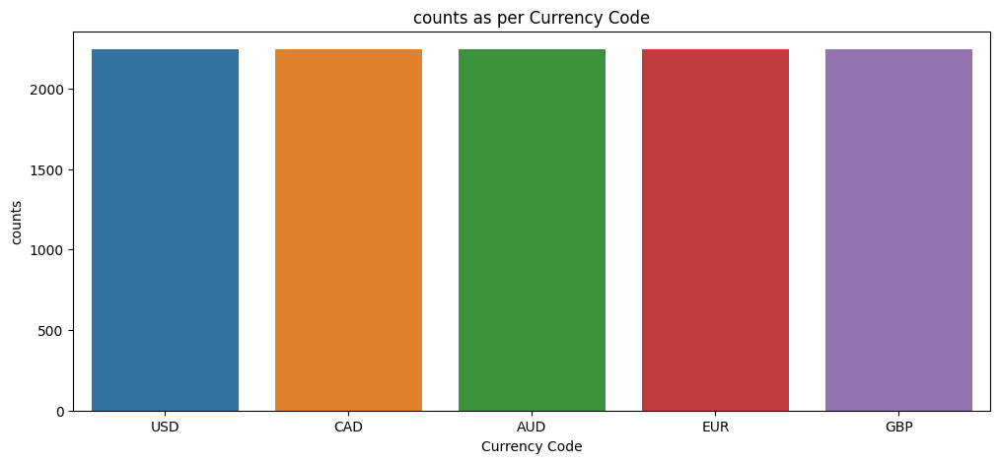

In [23]:
# visualize currency counts
plt.figure(figsize=(12,5))
sns.countplot(x=df_exchange["Currency Code"],data=df_exchange,hue="Currency Code")
plt.xlabel("Currency Code")
plt.ylabel("counts")
plt.title("counts as per Currency Code")

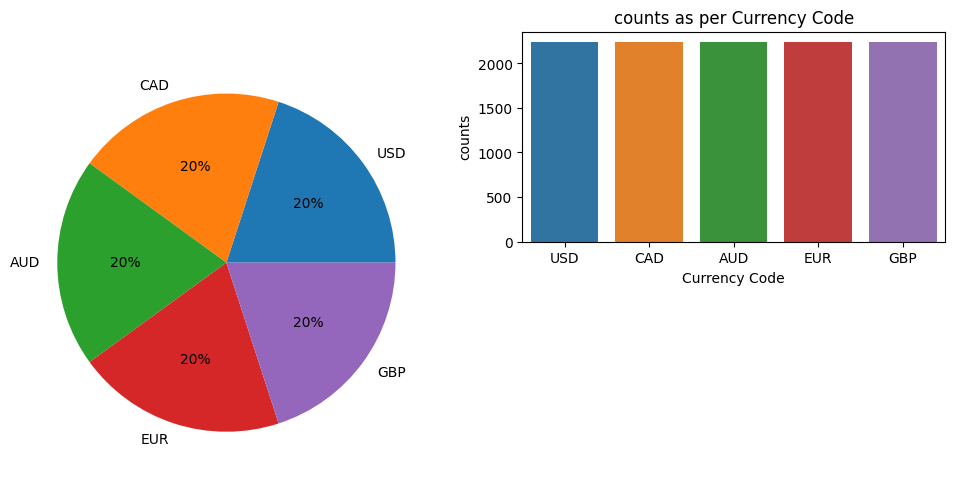

In [24]:
# visualize gender details
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.pie(df_exchange["Currency Code"].value_counts(), 
        autopct='%1.0f%%', 
        labels=['USD', 'CAD', 'AUD', 'EUR', 'GBP'])
plt.subplot(2,2,2)
sns.countplot(x=df_exchange["Currency Code"],data=df_exchange,hue="Currency Code")
plt.xlabel("Currency Code")
plt.ylabel("counts")
plt.title("counts as per Currency Code")
plt.show()

# **Products**

In [25]:
# load product table
path="Products.csv"
df_products=pd.read_csv(path)
df_products

,ProductKey,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category
0,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,$6.62,$12.99,101,MP4&MP3,1,Audio
1,2,Contoso 512MB MP3 Player E51 Blue,Contoso,Blue,$6.62,$12.99,101,MP4&MP3,1,Audio
2,3,Contoso 1G MP3 Player E100 White,Contoso,White,$7.40,$14.52,101,MP4&MP3,1,Audio
3,4,Contoso 2G MP3 Player E200 Silver,Contoso,Silver,$11.00,$21.57,101,MP4&MP3,1,Audio
4,5,Contoso 2G MP3 Player E200 Red,Contoso,Red,$11.00,$21.57,101,MP4&MP3,1,Audio
...,...,...,...,...,...,...,...,...,...,...
2512,2513,Contoso Bluetooth Active Headphones L15 Red,Contoso,Red,$43.07,$129.99,505,Cell phones Accessories,5,Cell phones
2513,2514,Contoso Bluetooth Active Headphones L15 White,Contoso,White,$43.07,$129.99,505,Cell phones Accessories,5,Cell phones
2514,2515,Contoso In-Line Coupler E180 White,Contoso,White,$1.71,$3.35,505,Cell phones Accessories,5,Cell phones
2515,2516,Contoso In-Line Coupler E180 Black,Contoso,Black,$1.71,$3.35,505,Cell phones Accessories,5,Cell phones


In [26]:
#check data types
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ProductKey      2517 non-null   int64 
 1   Product Name    2517 non-null   object
 2   Brand           2517 non-null   object
 3   Color           2517 non-null   object
 4   Unit Cost USD   2517 non-null   object
 5   Unit Price USD  2517 non-null   object
 6   SubcategoryKey  2517 non-null   int64 
 7   Subcategory     2517 non-null   object
 8   CategoryKey     2517 non-null   int64 
 9   Category        2517 non-null   object
dtypes: int64(3), object(7)
memory usage: 196.8+ KB


In [27]:
# check missing values
df_products.isnull().sum()

ProductKey        0
Product Name      0
Brand             0
Color             0
Unit Cost USD     0
Unit Price USD    0
SubcategoryKey    0
Subcategory       0
CategoryKey       0
Category          0
dtype: int64

In [28]:
df_products["Unit Cost USD"] = df_products["Unit Cost USD"].str.replace("$", "").str.replace(",", "")
df_products["Unit Cost USD"] = df_products["Unit Cost USD"].astype(float)

df_products["Unit Price USD"] = df_products["Unit Price USD"].str.replace("$", "").str.replace(",", "")
df_products["Unit Price USD"] = df_products["Unit Price USD"].astype(float)

In [29]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ProductKey      2517 non-null   int64  
 1   Product Name    2517 non-null   object 
 2   Brand           2517 non-null   object 
 3   Color           2517 non-null   object 
 4   Unit Cost USD   2517 non-null   float64
 5   Unit Price USD  2517 non-null   float64
 6   SubcategoryKey  2517 non-null   int64  
 7   Subcategory     2517 non-null   object 
 8   CategoryKey     2517 non-null   int64  
 9   Category        2517 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 196.8+ KB


In [30]:
# drop the column
df_products.drop(["SubcategoryKey"],axis=1,inplace=True)

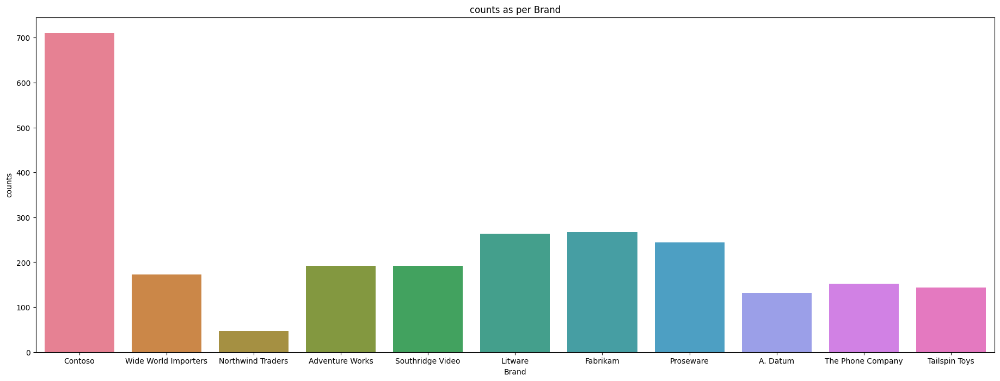

In [31]:
#visualize the brand and category
plt.figure(figsize=(50,8))
plt.subplot(1,2,1)
sns.countplot(x=df_products["Brand"],data=df_products,hue="Brand")
plt.xlabel("Brand")
plt.ylabel("counts")
plt.title("counts as per Brand")
plt.show()


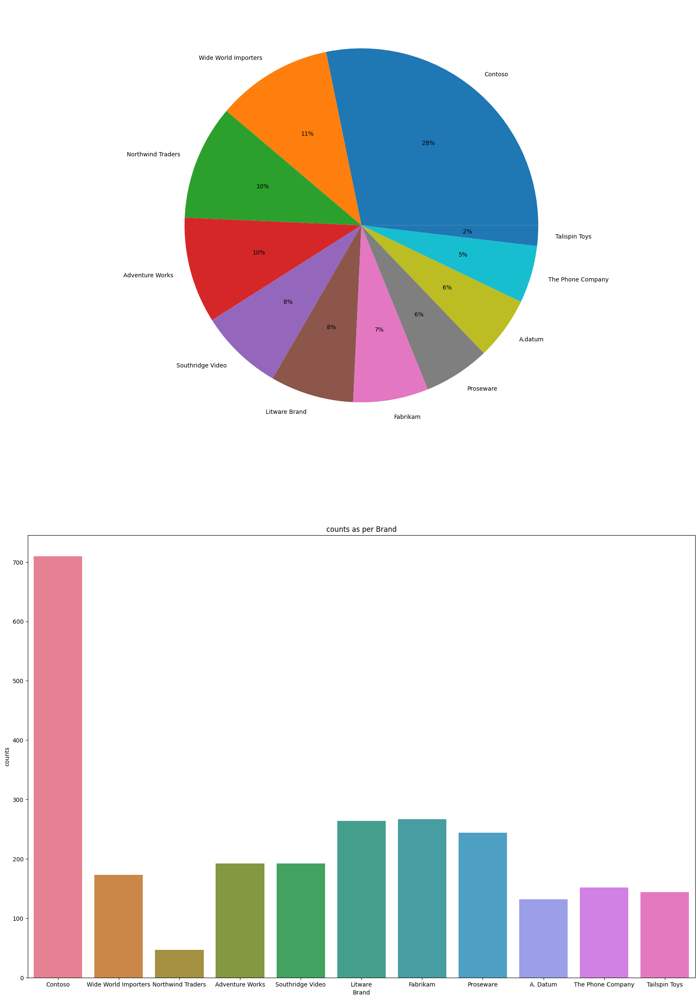

In [32]:
# visualize gender details
plt.figure(figsize=(45,30))
plt.subplot(2,2,1)
plt.pie(df_products["Brand"].value_counts(), 
        autopct='%1.0f%%', 
        labels=['Contoso', 'Wide World Importers', 'Northwind Traders', 'Adventure Works', 'Southridge Video', 'Litware Brand', 
                'Fabrikam', 'Proseware', 'A.datum', 'The Phone Company', 'Talispin Toys'])
plt.subplot(2,2,3)
sns.countplot(x=df_products["Brand"],data=df_products,hue="Brand")
plt.xlabel("Brand")
plt.ylabel("counts")
plt.title("counts as per Brand")
plt.show()

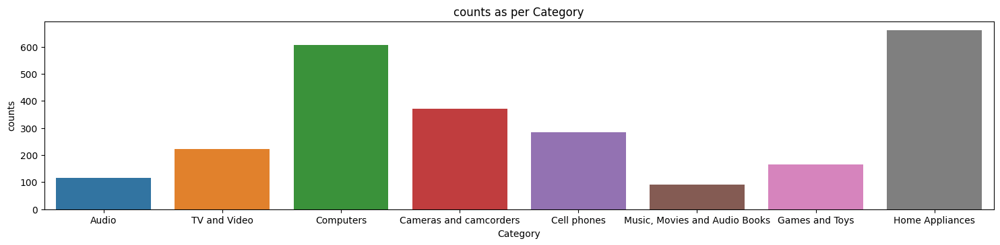

In [33]:
plt.figure(figsize=(40,8))
plt.subplot(2,2,2)
sns.countplot(x=df_products["Category"],data=df_products,hue="Category")
plt.xlabel("Category")
plt.ylabel("counts")
plt.title("counts as per Category")
plt.show()

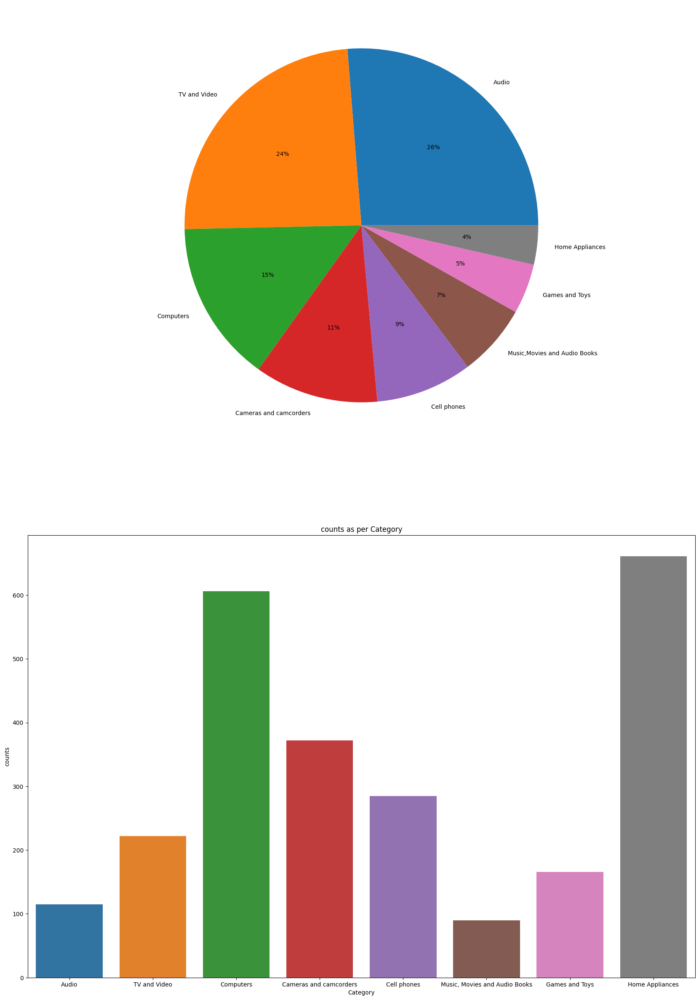

In [34]:
# visualize gender details
plt.figure(figsize=(45,30))
plt.subplot(2,2,1)
plt.pie(df_products["Category"].value_counts(), 
        autopct='%1.0f%%', 
        labels=['Audio', 'TV and Video', 'Computers', 'Cameras and camcorders', 'Cell phones', 'Music,Movies and Audio Books', 
                'Games and Toys', 'Home Appliances'])
plt.subplot(2,2,3)
sns.countplot(x=df_products["Category"],data=df_products,hue="Category")
plt.xlabel("Category")
plt.ylabel("counts")
plt.title("counts as per Category")
plt.show()

# **Sales**

In [4]:
# load sales table
path="Sales.csv"
df_sales=pd.read_csv(path)
df_sales

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,1/1/2016,NaN,265598,10,1304,1,CAD
1,366001,1,1/1/2016,1/13/2016,1269051,0,1048,2,USD
2,366001,2,1/1/2016,1/13/2016,1269051,0,2007,1,USD
3,366002,1,1/1/2016,1/12/2016,266019,0,1106,7,CAD
4,366002,2,1/1/2016,1/12/2016,266019,0,373,1,CAD
...,...,...,...,...,...,...,...,...,...
62879,2243030,1,2/20/2021,NaN,1216913,43,632,3,USD
62880,2243031,1,2/20/2021,2/24/2021,511229,0,98,4,EUR
62881,2243032,1,2/20/2021,2/23/2021,331277,0,1613,2,CAD
62882,2243032,2,2/20/2021,2/23/2021,331277,0,1717,2,CAD


In [34]:
#check data types
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62884 entries, 0 to 62883
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Order Number   62884 non-null  int64 
 1   Line Item      62884 non-null  int64 
 2   Order Date     62884 non-null  object
 3   Delivery Date  62884 non-null  object
 4   CustomerKey    62884 non-null  int64 
 5   StoreKey       62884 non-null  int64 
 6   ProductKey     62884 non-null  int64 
 7   Quantity       62884 non-null  int64 
 8   Currency Code  62884 non-null  object
dtypes: int64(6), object(3)
memory usage: 4.3+ MB


In [35]:
# check missing values
df_sales.isnull().sum()

Order Number     0
Line Item        0
Order Date       0
Delivery Date    0
CustomerKey      0
StoreKey         0
ProductKey       0
Quantity         0
Currency Code    0
dtype: int64

In [36]:
df_sales['Order Date'] = pd.to_datetime(df_sales['Order Date'], format="%m/%d/%Y", errors='coerce').dt.date

In [37]:
# fill the missing values
df_sales["Delivery Date"]=df_sales["Delivery Date"].fillna(0)

In [38]:
# check missing values
df_sales.isnull().sum()

Order Number     0
Line Item        0
Order Date       0
Delivery Date    0
CustomerKey      0
StoreKey         0
ProductKey       0
Quantity         0
Currency Code    0
dtype: int64

In [39]:
df_sales

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,2016-01-01,0,265598,10,1304,1,CAD
1,366001,1,2016-01-01,1/13/2016,1269051,0,1048,2,USD
2,366001,2,2016-01-01,1/13/2016,1269051,0,2007,1,USD
3,366002,1,2016-01-01,1/12/2016,266019,0,1106,7,CAD
4,366002,2,2016-01-01,1/12/2016,266019,0,373,1,CAD
...,...,...,...,...,...,...,...,...,...
62879,2243030,1,2021-02-20,0,1216913,43,632,3,USD
62880,2243031,1,2021-02-20,2/24/2021,511229,0,98,4,EUR
62881,2243032,1,2021-02-20,2/23/2021,331277,0,1613,2,CAD
62882,2243032,2,2021-02-20,2/23/2021,331277,0,1717,2,CAD


# **Stores**

In [8]:
# load sales table
path="Stores.csv"
df_stores=pd.read_csv(path)
df_stores

,StoreKey,Country,State,Square Meters,Open Date
0,1,Australia,Australian Capital Territory,595.0,1/1/2008
1,2,Australia,Northern Territory,665.0,1/12/2008
2,3,Australia,South Australia,2000.0,1/7/2012
3,4,Australia,Tasmania,2000.0,1/1/2010
4,5,Australia,Victoria,2000.0,12/9/2015
...,...,...,...,...,...
62,63,United States,Utah,2000.0,3/6/2008
63,64,United States,Washington DC,1330.0,1/1/2010
64,65,United States,West Virginia,1785.0,1/1/2012
65,66,United States,Wyoming,840.0,1/1/2014


In [9]:
# check missing values
df_stores.isnull().sum()

StoreKey         0
Country          0
State            0
Square Meters    1
Open Date        0
dtype: int64

In [10]:
#check data types
df_stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   StoreKey       67 non-null     int64  
 1   Country        67 non-null     object 
 2   State          67 non-null     object 
 3   Square Meters  66 non-null     float64
 4   Open Date      67 non-null     object 
dtypes: float64(1), int64(1), object(3)
memory usage: 2.7+ KB


In [11]:

df_stores.fillna(0)

,StoreKey,Country,State,Square Meters,Open Date
0,1,Australia,Australian Capital Territory,595.0,1/1/2008
1,2,Australia,Northern Territory,665.0,1/12/2008
2,3,Australia,South Australia,2000.0,1/7/2012
3,4,Australia,Tasmania,2000.0,1/1/2010
4,5,Australia,Victoria,2000.0,12/9/2015
...,...,...,...,...,...
62,63,United States,Utah,2000.0,3/6/2008
63,64,United States,Washington DC,1330.0,1/1/2010
64,65,United States,West Virginia,1785.0,1/1/2012
65,66,United States,Wyoming,840.0,1/1/2014


In [12]:

df_stores['Open Date'] = pd.to_datetime(df_stores['Open Date'], format="%m/%d/%Y", errors='coerce').dt.date

In [13]:

# replacing the nan value
df_stores = df_stores.replace({np.nan: None})
df_stores

,StoreKey,Country,State,Square Meters,Open Date
0,1,Australia,Australian Capital Territory,595.0,2008-01-01
1,2,Australia,Northern Territory,665.0,2008-01-12
2,3,Australia,South Australia,2000.0,2012-01-07
3,4,Australia,Tasmania,2000.0,2010-01-01
4,5,Australia,Victoria,2000.0,2015-12-09
...,...,...,...,...,...
62,63,United States,Utah,2000.0,2008-03-06
63,64,United States,Washington DC,1330.0,2010-01-01
64,65,United States,West Virginia,1785.0,2012-01-01
65,66,United States,Wyoming,840.0,2014-01-01


# **Create the sql database**

In [46]:
! pip install mysql-connector-python


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [47]:
import mysql.connector
mydb = mysql.connector.connect(
 host="localhost",
 user="root",
 password="",


)


print(mydb)
mycursor = mydb.cursor(buffered=True)

In [48]:
import mysql.connector

connection = mysql.connector.connect(
  host = "gateway01.ap-southeast-1.prod.aws.tidbcloud.com",
  port = 4000,
  user = "27BWX9vSyueH94y.root",
  password = "q1GlXoLTU7A9BpHQ",
 
)

In [71]:
mycursor.execute("CREATE DATABASE IF NOT EXISTS Data_Spark")
print("database created successfully")

database created successfully


In [22]:
mycursor.execute("DROP TABLE data_spark.customer_details")

In [40]:
#customer table creation
mycursor.execute('''CREATE TABLE data_Spark.customer_details(
                  CustomerKey INT,
                  Gender VARCHAR(255),
                  Name VARCHAR(255),
                  City VARCHAR(255),
                  State VARCHAR(255),
                  Country VARCHAR(255),
                  Continent VARCHAR(255),
                  Birthday VARCHAR(255)
                  )''')
print("Table Created successfully")

Table Created successfully


In [70]:
#mycursor.execute("DROP DATABASE customer_sales")

In [41]:
# SQL query to insert data into bus_details table
insert_query = '''INSERT INTO data_Spark.customer_details(
                  CustomerKey,
                  Gender,
                  Name,
                  City,
                  State,
                  Country,
                  Continent,
                  Birthday)
                  VALUES(%s, %s, %s, %s, %s, %s, %s, %s)'''
data = df_customers.values.tolist()

mycursor.executemany(insert_query, data)

mydb.commit()

print("Values inserted successfully")

Values inserted successfully


if Code Shown any error, go to your MySQL Server execute this code :- "SET GLOBAL max_allowed_packet = 67108864;  -- Sets it to 64MB"

In [74]:
# exchange table creation
mycursor.execute('''CREATE TABLE IF NOT EXISTS data_Spark.exchange_details(
                  Date VARCHAR(255),
                  Currency_Code VARCHAR(255),
                  Exchange FLOAT
                  )''')
print("Table Created successfully")

Table Created successfully


In [75]:
# insert values into exchange table
insert_query ='''INSERT INTO data_Spark.exchange_details(
                  Date,
                 Currency_Code,
                  Exchange)
                  VALUES (%s, %s, %s)'''
data=df_exchange.values.tolist()
mycursor.executemany(insert_query,data)
print("Inserted successfully")

Inserted successfully


In [76]:
# create Products table 
mycursor.execute('''CREATE TABLE IF NOT EXISTS data_Spark.product_details(
                  ProductKey INT,
                  Product_Name VARCHAR(255),
                  Brand VARCHAR(255),
                  Color VARCHAR(255),
                  Unit_Cost_USD FLOAT,
                  Unit_Price_USD FLOAT,
                  Subcategory VARCHAR(255),
                  CategoryKey VARCHAR(255),
                  Category VARCHAR(255)
                  )''')
print("Table Created successfully")

Table Created successfully


In [77]:
#insert values into Products table
insert_query ='''INSERT INTO data_Spark.product_details(
                  ProductKey,
                  Product_Name,
                  Brand,
                  Color,
                  Unit_Cost_USD,
                  Unit_Price_USD,
                  Subcategory,
                  CategoryKey,
                  Category)
                  VALUES (%s, %s, %s, %s, %s, %s, %s, %s,%s)'''
data=df_products.values.tolist()
mycursor.executemany(insert_query,data)
print("Inserted successfully")

Inserted successfully


In [40]:
mycursor.execute("DROP TABLE data_spark.sales_details")

In [41]:
#sales table creation
mycursor.execute('''CREATE TABLE IF NOT EXISTS data_Spark.sales_details(
                  Order_Number INT,
                  Line_Item INT,
                  Order_Date VARCHAR(255),
                  Delivery_Date VARCHAR(255),
                  CustomerKey INT,
                  StoreKey INT,
                  ProductKey INT,
                  Quantity INT,
                  Currency_Code VARCHAR(255)
                  )''')
print("Table Created successfully")

Table Created successfully


In [42]:
#insert values into sales table
insert_query ='''INSERT INTO data_Spark.sales_details(
                  Order_Number,
                  Line_Item,
                  Order_Date,
                  Delivery_Date,
                  CustomerKey,
                  StoreKey,
                  ProductKey,
                  Quantity,
                  Currency_Code)
                  VALUES (%s, %s, %s, %s, %s, %s, %s, %s,%s)'''
data=df_sales.values.tolist()
mycursor.executemany(insert_query,data)
print("Inserted successfully")

Inserted successfully


In [43]:
mycursor.execute("select * from data_spark.sales_details")
out = mycursor.fetchall()
from tabulate import tabulate
print(tabulate(out, headers=[i[0] for i in mycursor.description], tablefmt='psql'))

+----------------+-------------+--------------+-----------------+---------------+------------+--------------+------------+-----------------+
|   Order_Number |   Line_Item | Order_Date   | Delivery_Date   |   CustomerKey |   StoreKey |   ProductKey |   Quantity | Currency_Code   |
|----------------+-------------+--------------+-----------------+---------------+------------+--------------+------------+-----------------|
|         366000 |           1 | 2016-1-1     | 0               |        265598 |         10 |         1304 |          1 | CAD             |
|         366001 |           1 | 2016-1-1     | 1/13/2016       |       1269051 |          0 |         1048 |          2 | USD             |
|         366001 |           2 | 2016-1-1     | 1/13/2016       |       1269051 |          0 |         2007 |          1 | USD             |
|         366002 |           1 | 2016-1-1     | 1/12/2016       |        266019 |          0 |         1106 |          7 | CAD             |
|         366

In [44]:
#sales table

# Update existing data to convert it to DATE format
update_query = """
    UPDATE data_spark.sales_details
    SET Order_Date = STR_TO_DATE(Order_Date, '%m/%d/%Y')
    WHERE STR_TO_DATE(Order_Date, '%m/%d/%Y') IS NOT NULL
"""
mycursor.execute(update_query)

# Alter the column data type to DATE
alter_query = """
    ALTER TABLE data_spark.sales_details
    MODIFY COLUMN Order_Date DATE
"""
mycursor.execute(alter_query)

# Commit the transaction to save changes
mydb.commit()

In [25]:
#store table creation
mycursor.execute('''CREATE TABLE IF NOT EXISTS data_spark.stores_details(
                  StoreKey INT,
                  Country VARCHAR(255),
                  State VARCHAR(255),
                  Square_Meters FLOAT,
                  Open_Date VARCHAR(255)
                  )''')
print("Table Created successfully")

Table Created successfully


In [26]:
##insert values into Store table
insert_query = '''
    INSERT INTO data_spark.stores_details(
        StoreKey,
        Country,
        State,
        Square_Meters,
        Open_Date)
    VALUES (%s, %s, %s, %s, %s)'''
data=df_stores.values.tolist()
mycursor.executemany(insert_query,data)
print("Inserted successfully")

Inserted successfully


# **Change dtypes to date**

In [53]:
! pip install mysql-connector-python
! pip install tabulate


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [54]:
#customer table

# Update existing data to convert it to DATE format
update_query = """
    UPDATE data_spark.customer_details
    SET Birthday = STR_TO_DATE(Birthday, '%m/%d/%Y')
    WHERE STR_TO_DATE(Birthday, '%m/%d/%Y') IS NOT NULL
"""
mycursor.execute(update_query)

# Alter the column data type to DATE
alter_query = """
    ALTER TABLE data_spark.customer_details
    MODIFY COLUMN Birthday DATE
"""
mycursor.execute(alter_query)

# Commit the transaction to save changes
mydb.commit()

In [55]:
#sales table

# Update existing data to convert it to DATE format
update_query = """
    UPDATE data_spark.sales_details
    SET Order_Date = STR_TO_DATE(Order_Date, '%m/%d/%Y')
    WHERE STR_TO_DATE(Order_Date, '%m/%d/%Y') IS NOT NULL
"""
mycursor.execute(update_query)

# Alter the column data type to DATE
alter_query = """
    ALTER TABLE data_spark.sales_details
    MODIFY COLUMN Order_Date DATE
"""
mycursor.execute(alter_query)

# Commit the transaction to save changes
mydb.commit()

In [56]:
#stores table

# Update existing data to convert it to DATE format
update_query = """
    UPDATE data_spark.stores_details
    SET Open_Date = STR_TO_DATE(Open_Date, '%m/%d/%Y')
    WHERE STR_TO_DATE(Open_Date, '%m/%d/%Y') IS NOT NULL
"""
mycursor.execute(update_query)

# Alter the column data type to DATE
alter_query = """
    ALTER TABLE data_spark.stores_details
    MODIFY COLUMN Open_Date DATE
"""
mycursor.execute(alter_query)

# Commit the transaction to save changes
mydb.commit()

In [58]:
#exchange rate table

# Update existing data to convert it to DATE format
update_query = """
    UPDATE data_spark.exchange_details
    SET Date = STR_TO_DATE(Date, '%m/%d/%Y')
    WHERE STR_TO_DATE(Date, '%m/%d/%Y') IS NOT NULL
"""
mycursor.execute(update_query)

# Alter the column data type to DATE
alter_query = """
    ALTER TABLE data_spark.exchange_details
    MODIFY COLUMN Date DATE
"""
mycursor.execute(alter_query)

# Commit the transaction to save changes
mydb.commit()

In [ ]:
# mycursor.execute ("select * from data_spark.customer_details")
# mycursor.execute ("select * from data_spark.exchange_details")
# mycursor.execute ("select * from data_spark.product_details")
# mycursor.execute ("select * from data_spark.sales_details")
# mycursor.execute ("select * from data_spark.stores_details")
# # -- Describe sales_details
# # Fetch all data from the table
# mycursor.execute("SELECT * FROM data_spark.sales_details")
# sales_data = mycursor.fetchall()

# # Fetch table structure (metadata)
# mycursor.execute("""
#     SELECT COLUMN_NAME, DATA_TYPE, IS_NULLABLE, CHARACTER_MAXIMUM_LENGTH
#     FROM INFORMATION_SCHEMA.COLUMNS
#     WHERE TABLE_SCHEMA = 'data_spark' AND TABLE_NAME = 'sales_details'
# """)
# table_structure = mycursor.fetchall()

# # -- Describe customer_details
# # Fetch all data from the table
# mycursor.execute("SELECT * FROM data_spark.customer_details")
# sales_data = mycursor.fetchall()

# # Fetch table structure (metadata)
# mycursor.execute("""
#     SELECT COLUMN_NAME, DATA_TYPE, IS_NULLABLE, CHARACTER_MAXIMUM_LENGTH
#     FROM INFORMATION_SCHEMA.COLUMNS
#     WHERE TABLE_SCHEMA = 'data_spark' AND TABLE_NAME = 'customer_details'
# """)
# table_structure = mycursor.fetchall()